# Version FINALE

# Explication du projet

> Nous avons à notre disposition les images de races de chiens issues du site de Standford<br>
http://vision.stanford.edu/aditya86/ImageNetDogs/
> 
> Nous devons modéliser l'indexation des images de façon à pouvoir identifier la race du chien sur une image donnée.

> 
> Nous traitons ici de la méthode de Vision par Ordinateur Traditionnelle

# Librairies

In [1]:
import os
import mes_fonctions as stt
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime 

from PIL import Image
import cv2

In [1276]:
import imp
imp.reload(stt)

<module 'mes_fonctions' from '/Users/seb/Workspace/Dev/Formation-OC/Formation-Data-Scientist/PROJET7-CLASSIFICATION_IMAGES/NOTEBOOKS/PROJET2/mes_fonctions.py'>

# Chargement

#### Variables de Test

In [ ]:
path_images = '../PROJET/data/data/Images'

### Fichier de Description
Ce fichier est composé de :  
- file (index)
- subpath : sous-répertoire comprenant les chiens de même race
- race : la race (sans le numéro de répertoire)
- W : weight 
- H : heigth
- Les infos de crop
    - x_min 
    - x_max
    - y_min
    - y_max


In [4]:
# Chargement du DataSet 
desc = pd.read_csv('output/Descriptions.csv', index_col='file')

### Séparation Train/Test
> On sépare les données à partir de Desc 
> <br>
> Optionnel : on filtre sur une liste de races de chiens
> <br> 
> On récupère le fichier de description divisé en 2 : train / test

In [88]:
# Répartition en train / test

## Nous prenons ici uniquement 6 races de chiens
desc_train, desc_test = stt.repartition_data_train_test_by_liste(desc, ratio_train=0.8, liste=stt.liste_6_races)

def get_path_from(name, path='../PROJET/data/data/Images'):
    info = desc_train.loc['n02115641_7071']
    return path + '/' + info.subpath + '/' + info.name + '.jpg'

In [ ]:
a.head()

In [11]:
path1 = '../PROJET/data/data/Images'
u1 = cv2.imread(path1+'/'+'n02097658-silky_terrier'+'/'+'n02097658_271.jpg', 0)

# Exploration rapide des données

In [14]:
print('Nous disposons de {nb_race} races.'.format(nb_race=desc.race.nunique()))
print('Nous disposons de {nb_chien} images de chiens.'.format(nb_chien=desc.shape[0]))

Nous disposons de 120 races.
Nous disposons de 20580 races.


## Les races les plus représentées

In [26]:
freq = desc.groupby(by=['race']).size().reset_index(name='Freq')
freq.sort_values(by='Freq', ascending=False, inplace=True)
freq.head()

,race,Freq
44,Maltese_dog,252
0,Afghan_hound,239
60,Scottish_deerhound,232
53,Pomeranian,219
58,Samoyed,218


In [27]:
freq.tail()

,race,Freq
95,golden_retriever,150
91,dhole,150
74,affenpinscher,150
51,Pekinese,149
109,redbone,148


## Taille des Images

In [33]:
u = stt.info_size(desc)
u.describe()

,W,H,d_x,d_y
count,20580.000000,20580.000000,20580.000000,20580.000000
mean,442.531876,385.861224,289.040671,297.629932
std,142.792308,124.863446,128.577818,119.853244
min,97.000000,100.000000,32.000000,38.000000
25%,361.000000,333.000000,200.000000,220.000000
50%,500.000000,375.000000,279.000000,291.000000
75%,500.000000,453.000000,362.000000,357.000000
max,3264.000000,2562.000000,2735.000000,2025.000000


# Analyse sur 6 races de chiens

In [37]:
desc_train, desc_test = stt.repartition_data_train_test_by_liste(desc, ratio_train=0.8, liste=stt.liste_6_races)

### Les races représentées

In [36]:
freq = desc_train.groupby(by=['race']).size().reset_index(name='Freq')
freq.sort_values(by='Freq', ascending=False, inplace=True)
freq

,race,Freq
0,African_hunting_dog,135
5,standard_poodle,127
1,Mexican_hairless,124
3,dingo,124
4,miniature_poodle,124
2,dhole,120


### Les informations sur les tailles

In [39]:
stt.info_size(desc_train).describe()

,W,H,d_x,d_y
count,754.000000,754.000000,754.000000,754.000000
mean,432.693634,370.192308,279.364721,282.092838
std,136.706985,112.040812,120.758420,115.109668
min,125.000000,126.000000,51.000000,44.000000
25%,346.750000,316.250000,191.250000,195.000000
50%,500.000000,374.500000,266.000000,276.500000
75%,500.000000,426.750000,355.750000,352.000000
max,1492.000000,1163.000000,1147.000000,1149.000000


> Nous pouvons mettre toutes les images à la taille : 280 x 280 (qui est la moyenne)

# Traitements à Appliquer
> Nous allons appliquer différents traitements d'images à celles-ci
- Transformation en niveau de gris de l'image
- Un filtre Gaussien de Floutage pour débruiter celle-ci, via 2 paramètres :
    - la taille du noyau de filtrage BLUR_SIZE
    - l'écart type du filtre
- Un crop selon les données disponible sur les infos de chaque fichiers
- Une égalisation de l'histogramme
- Un resize pour mettre toutes les images à une même taille
<br><br>
- Ensuite nous mettons en vecteur les valeurs des intensités des images

/!\ La fonction 'Copy Into' permet de faire un resize de l'image en mettant un bord noir afin de conserver le ratio largeur / hauteur, tout en minimisant le nombre de pixel noirs.

In [340]:
imp.reload(stt)

<module 'mes_fonctions' from '/Users/seb/Workspace/Dev/Formation-OC/Formation-Data-Scientist/PROJET7-CLASSIFICATION_IMAGES/NOTEBOOKS/PROJET2/mes_fonctions.py'>

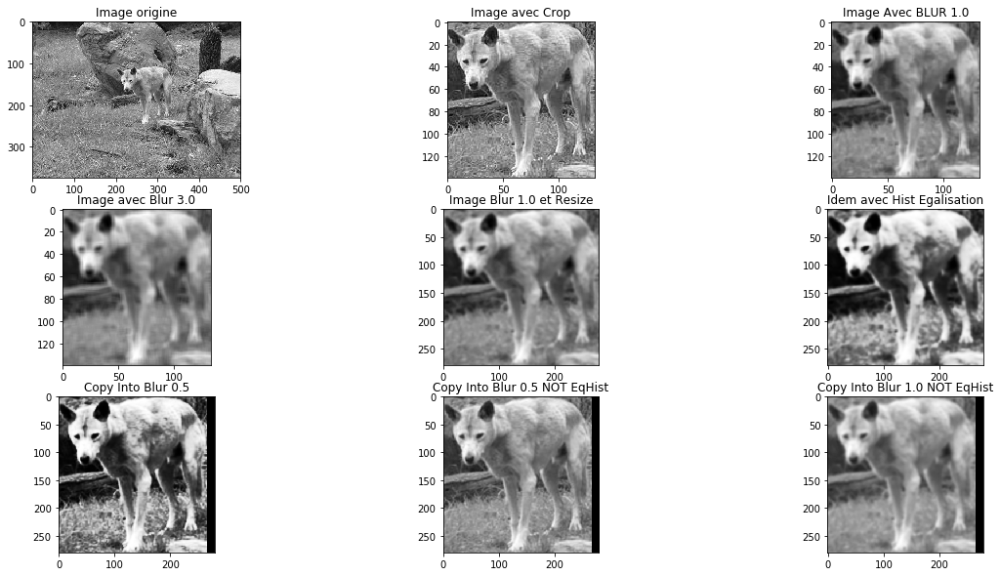

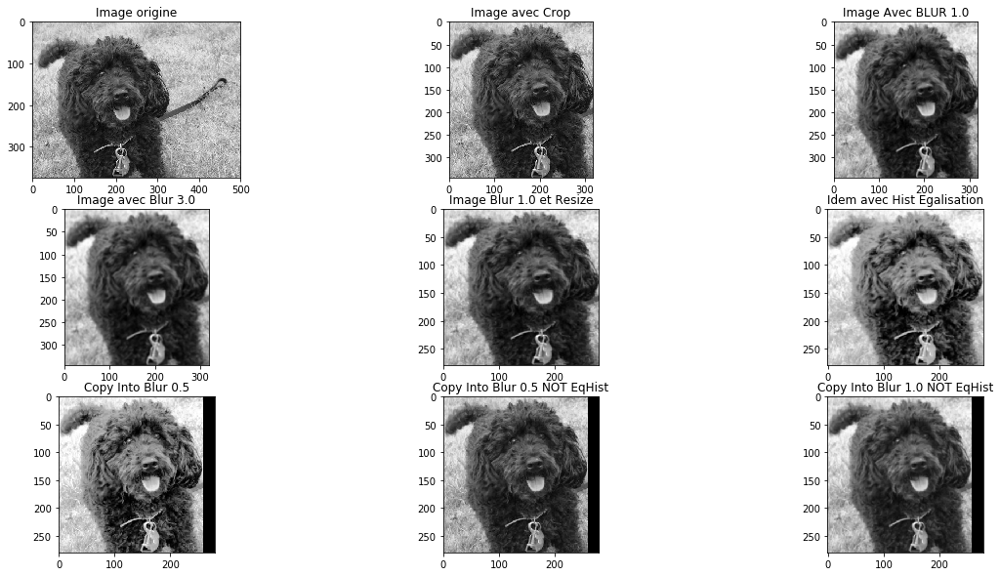

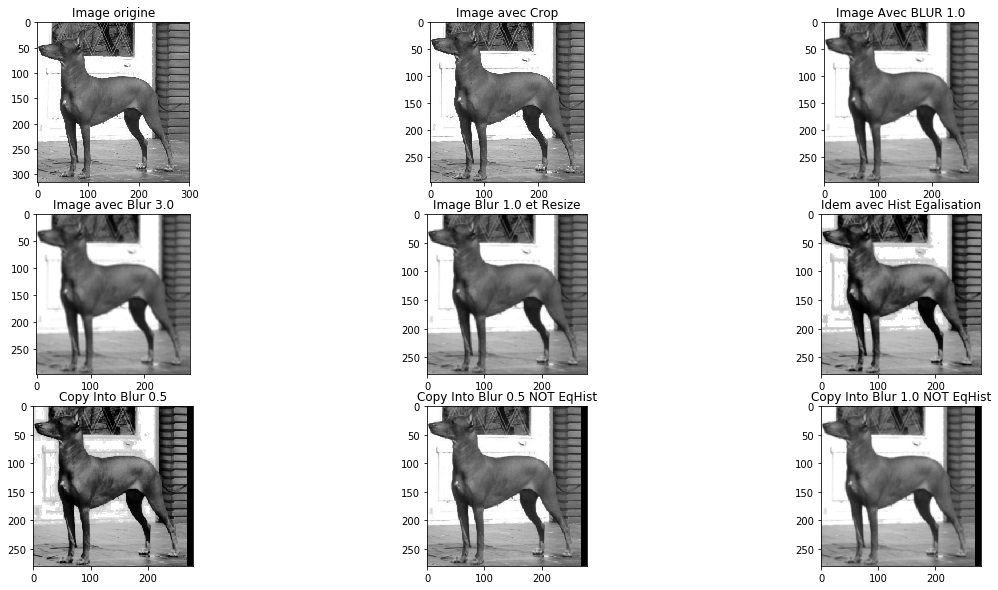

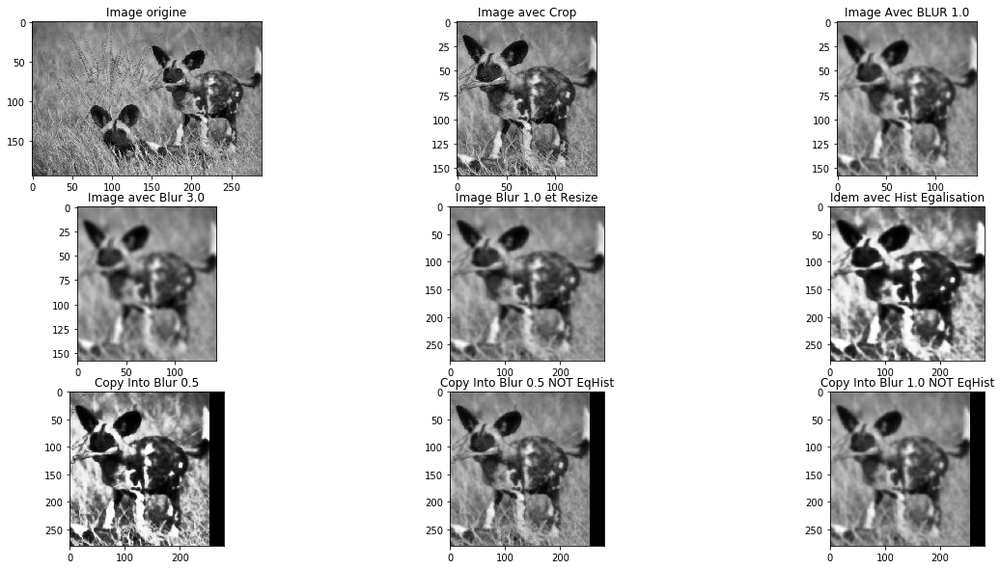

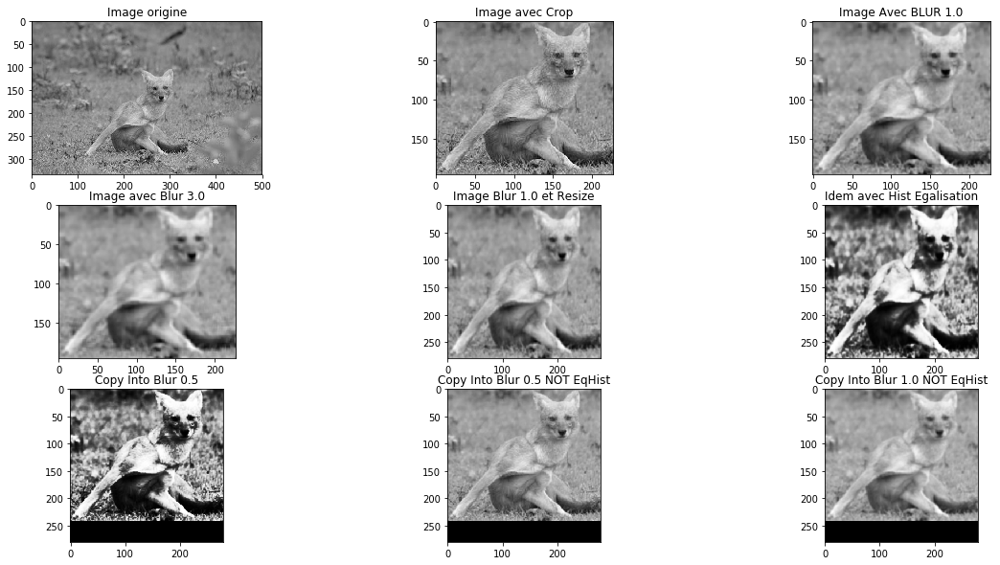

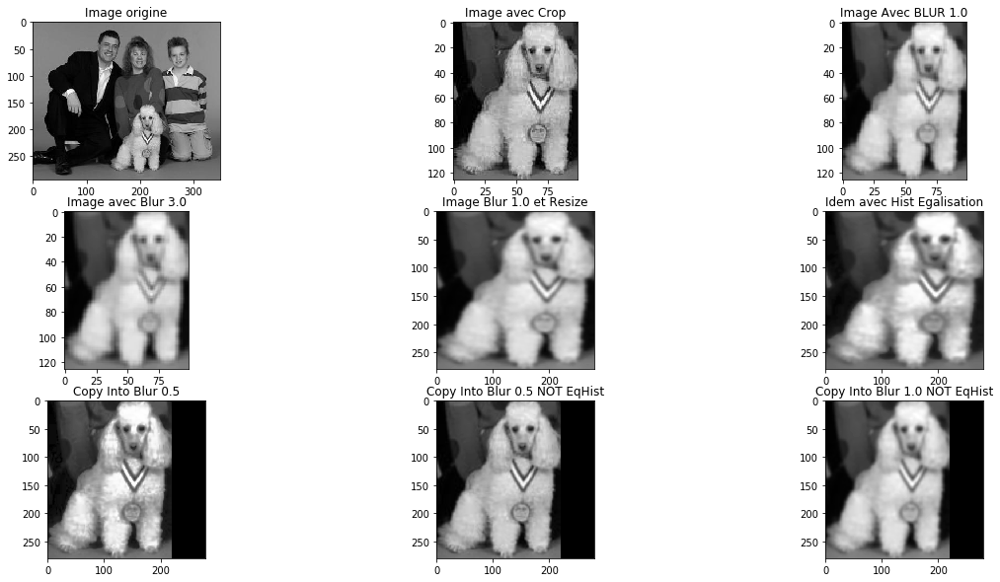

In [341]:
stt.affiche_images(name1 = 'n02115641_7071', desc_train=desc, path1=path1)
stt.affiche_images(name1 = 'n02113712_3261', desc_train=desc, path1=path1)
stt.affiche_images(name1 = 'n02113978_3822', desc_train=desc, path1=path1)
stt.affiche_images(name1 = 'n02116738_7008', desc_train=desc, path1=path1)
stt.affiche_images(name1 = 'n02115913_2480', desc_train=desc, path1=path1)
stt.affiche_images(name1 = 'n02113712_3120', desc_train=desc, path1=path1)

# Détection de Features SIFT

In [102]:
def ajoute_kp_SIFT(image):
    sift = cv2.xfeatures2d.SIFT_create()
    kp = sift.detect(image, None)
    img=cv2.drawKeypoints(image,kp,image,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

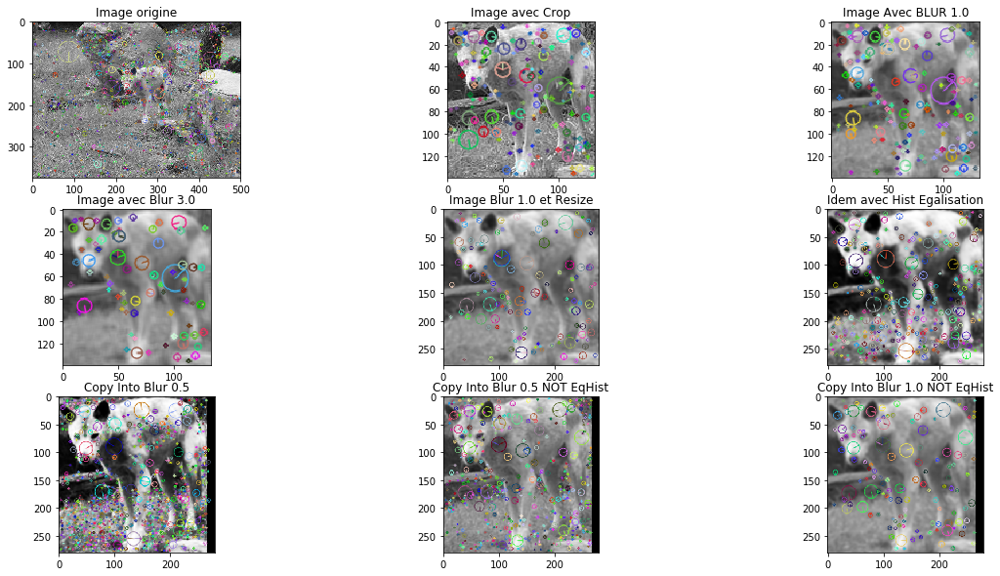

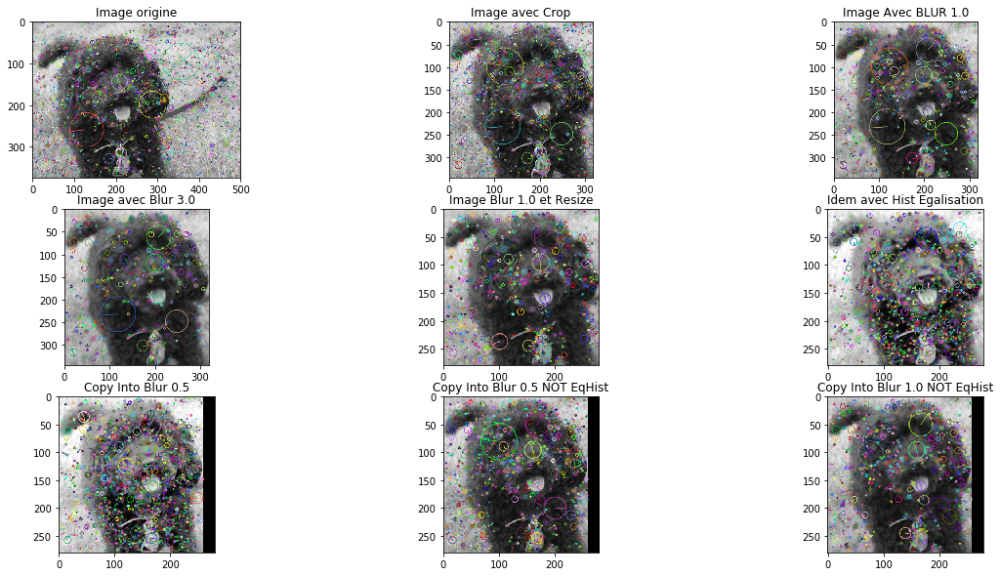

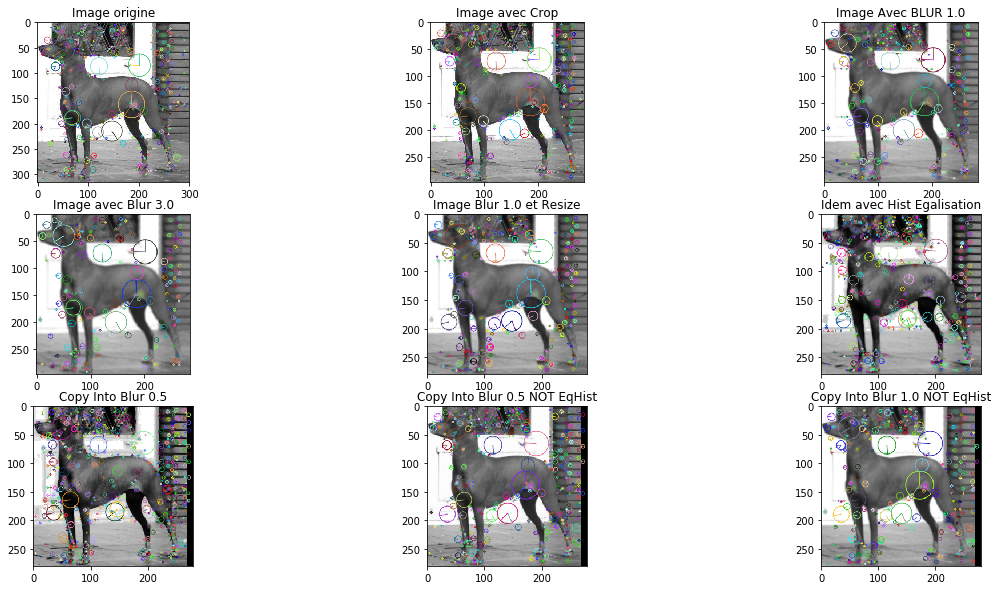

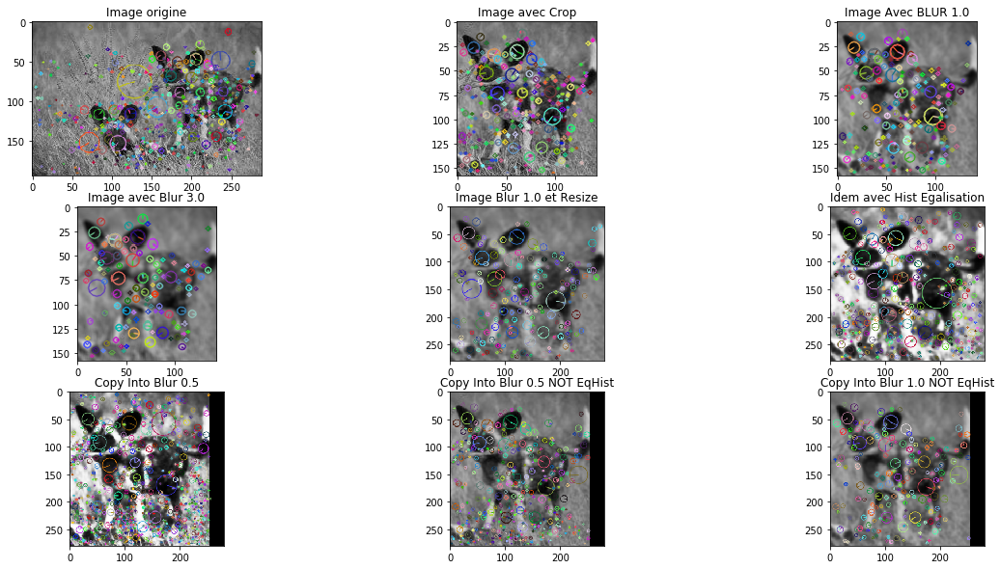

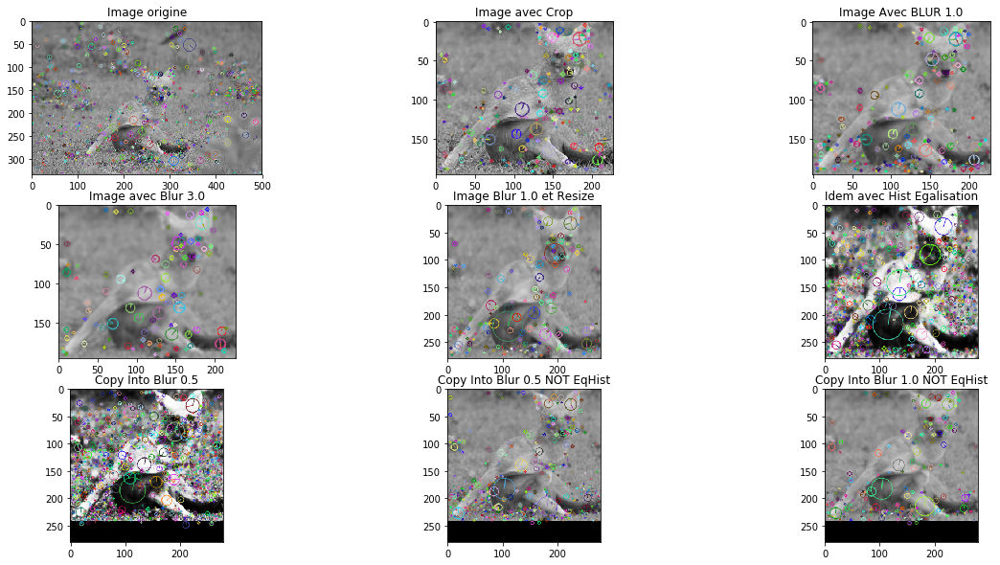

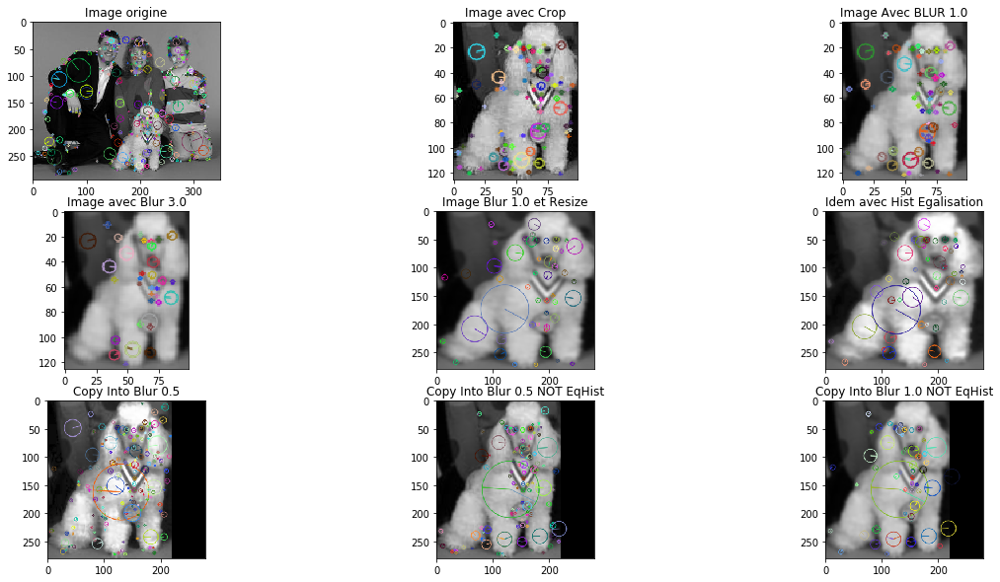

In [342]:
stt.affiche_images(name1 = 'n02115641_7071', desc_train=desc, path1=path1, transfo_image=ajoute_kp_SIFT)
stt.affiche_images(name1 = 'n02113712_3261', desc_train=desc, path1=path1, transfo_image=ajoute_kp_SIFT)
stt.affiche_images(name1 = 'n02113978_3822', desc_train=desc, path1=path1, transfo_image=ajoute_kp_SIFT)
stt.affiche_images(name1 = 'n02116738_7008', desc_train=desc, path1=path1, transfo_image=ajoute_kp_SIFT)
stt.affiche_images(name1 = 'n02115913_2480', desc_train=desc, path1=path1, transfo_image=ajoute_kp_SIFT)
stt.affiche_images(name1 = 'n02113712_3120', desc_train=desc, path1=path1, transfo_image=ajoute_kp_SIFT)

> Si on s'attache à identifier des points clefs sur les oreilles, la truffe, les pates, les yeux etc.. on s'aperçoit que ce sont les 2 dernières versions qui arrive à identifier ces points.
> <br>
> On s'aperçoit que l'égalisation d'histogramme ajoute un grand nombre de features clefs sur l'arrière plan, et perd 
> <br>
> On note que la dernière image semble supprimer plus de faux points clefs, mais c'est peut-être du hasard.
> <br>
> Il faudra donc conserver 
> - des valeurs d'écart-type du noyau Gaussien de 0.5 et 1.0 
> - appliquer un crop
> - ne pas faire d'équalisation d'histogramme
> - faire un resize into (ajouter un cadre noir pour les partie autres que l'image) mais ne supprime pas les rapport hauteur/largeure

# Application à toutes les images

1. on met les images dans une matrice
2. on extrait les features SIFT (seuillées / normalisées)
3. on fait un kmean (grid search pour le nombre de clusters)
4. on fait la recherche par histogramme 
5. on modélise

## Création d'une matrice commune

In [357]:
def create_image_matrix(desc, ):
    l_np_image = []
    SIZE = (280, 280)
    for image_name in desc.index.tolist():
        m_image = stt.transforme_image(
            desc=desc, name=image_name, rep_path=path1,
            is_crop=True, is_resize=True, is_blur=True,
            is_Inline=True, BLUR_SIZE=5, BLUR_SIGMAX=1.0,
            is_equalizeHist=False, is_resize_into=True,
            SIZE_GLOBAL=SIZE
        )
        l_np_image.append(m_image)
    return l_np_image

In [488]:
debut = datetime.now()
u_train = create_image_matrix(desc_train)

u_train = np.array(u_train)
fin = datetime.now()
print('Tps Fabrication Matrice Image : ', fin-debut)

Tps Fabrication Matrice Image :  0:00:01.244292


In [487]:
debut = datetime.now()
u_test = create_image_matrix(desc_test)
u_test = np.array(u_test)

fin = datetime.now()
print('Tps Fabrication Matrice Image : ', fin-debut)

Tps Fabrication Matrice Image :  0:00:00.379790


## Réduction de matrice des images

In [387]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

def creation_datas_pca(desc, matrice_image):
    '''Fabrication d'un df PCA, et d'un vecteur de race'''

    std = StandardScaler()
    x0 = std.fit_transform(matrice_image)

    pca = PCA(n_components=10)
    X = pca.fit_transform(x0)
    
    le = LabelEncoder()
    Y = le.fit_transform(desc.race)
    
    return X, Y



In [366]:
debut = datetime.now()
x_1, y_1 = creation_datas(desc_train, u_train)

fin = datetime.now()
print('Tps Creation PCA: ', fin-debut)


x_1 = pd.DataFrame(x_1)
x_1.head()

/Users/seb/anaconda/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype uint8 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Tps Creation PCA:  0:00:02.622913


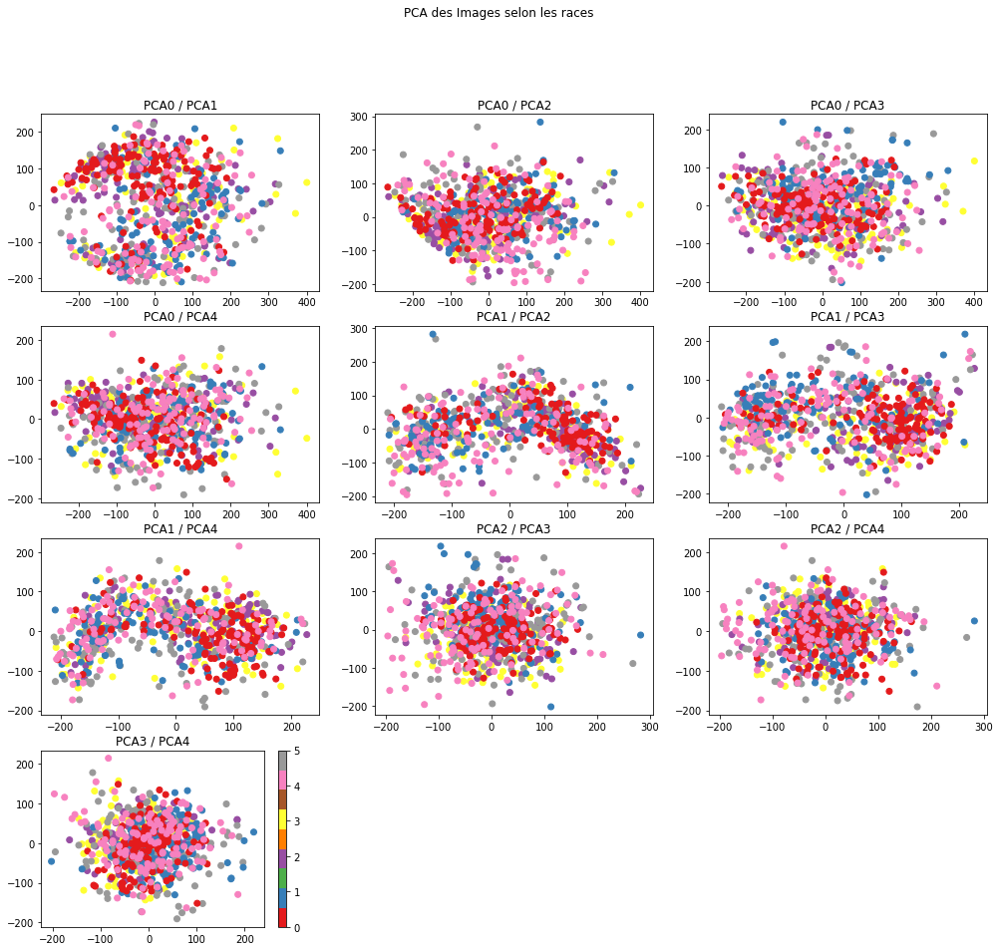

In [385]:
plt.figure(figsize=(17, 15))
idx = 0

for i in range(0,5):
    for j in range(i+1, 5):
        idx+=1
        plt.subplot(4, 3, idx)
        plt.scatter(x=x_1[i], y=x_1[j], c=y_1, cmap='Set1')
        plt.title('PCA{} / PCA{}'.format(i, j))
plt.colorbar()
#plt.colorbar.set_label('Races des chiens')
plt.suptitle('PCA des Images selon les races')
plt.show()

In [388]:
def creation_datas_tsne(desc, matrice_image):
    '''Fabrication d'un df PCA, et d'un vecteur de race'''

    std = StandardScaler()
    x0 = std.fit_transform(matrice_image)

    tsne = TSNE()
    X = tsne.fit_transform(x0)
    
    le = LabelEncoder()
    Y = le.fit_transform(desc.race)
    
    return X, Y

/Users/seb/anaconda/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype uint8 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Tps Creation TSNE:  0:00:02.496580


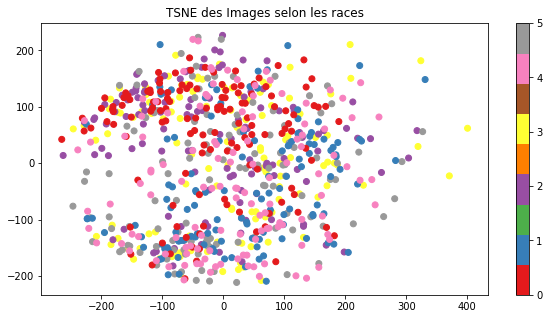

In [394]:
debut = datetime.now()
x_2, y_2 = creation_datas(desc_train, u_train)

fin = datetime.now()
print('Tps Creation TSNE: ', fin-debut)


x_2 = pd.DataFrame(x_2)

plt.figure(figsize=(10, 5))
plt.scatter(x=x_2[0], y=x_2[1], c=y_2, cmap='Set1')
plt.colorbar()
plt.title('TSNE des Images selon les races')
plt.show()

> Ces réduction n'apporte à priori pas d'information sur les regroupements de races
> <br>
> Un tsne n'apporte pas plus d'information ici

## Whitening
> Ce traitement permet d'apporter un lissage des bruits blancs sur l'ensemble des images
> <br>
> Regardons si cela semble apporter quelque chose dans notre cas

In [446]:
def whitening(X, epsilon=0.1):
    X_norm = X / 255.
    cov = np.cov(X_norm, rowvar=True)
    U,S,V = np.linalg.svd(cov)
  
    MAT1 = U.dot(np.diag(1.0/np.sqrt(S + epsilon))).dot(U.T)
    #X_ZCA = U.dot(np.diag(1.0/np.sqrt(S + epsilon))).dot(U.T).dot(X_norm)
    X_ZCA = MAT1.dot(X_norm)
    X_ZCA_rescaled = (X_ZCA - X_ZCA.min()) / (X_ZCA.max() - X_ZCA.min())
    
    ###X_ZCA_rescaled = pd.DataFrame(np.uint8(X_ZCA_rescaled*255), index=desc_train.index)
    return MAT1, X_ZCA_rescaled


In [426]:
u_train = pd.DataFrame(np.uint8(u_train), index=desc_train.index)

In [442]:
#IMAGE_NAME = 'n02113712_3120'
def affiche_diff_avec_sans_whitening(IMAGE_NAME,u_train, u_train_whit):
    try:
        plt.figure(figsize=(10, 10))
        plt.subplot(121)
        plt.imshow(ajoute_kp_SIFT(u_train.loc[IMAGE_NAME].values.reshape(280, 280)), cmap='gray')
        plt.title('Sans Whitening')
        plt.subplot(122)
        plt.imshow(ajoute_kp_SIFT(u_train_whit.loc[IMAGE_NAME].values.reshape(280, 280)), cmap='gray')
        plt.title('Avec Whitening')
        plt.show()
    except:
        print("Erreur sur l'image : {}".format(IMAGE_NAME))

Tps Whitening:  0:00:02.038994


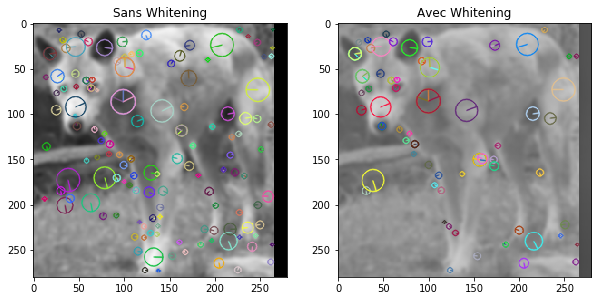

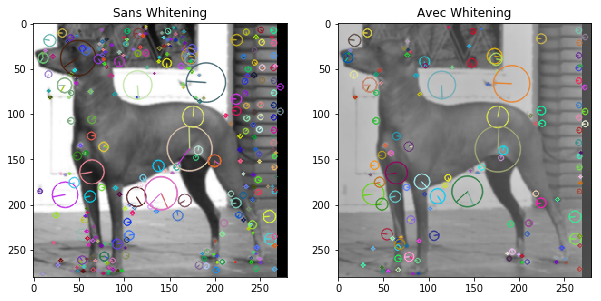

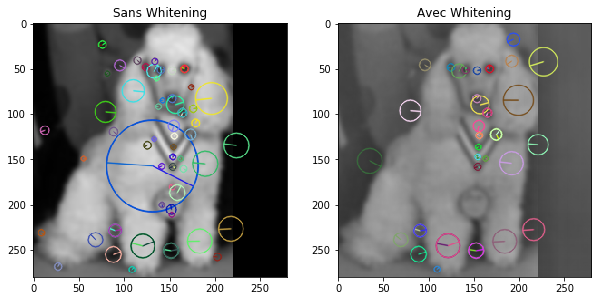

In [456]:
debut = datetime.now()
M1, u_train_whit = whitening(u_train, epsilon=1.5)
u_train_whit = pd.DataFrame(np.uint8(u_train_whit*255), index=desc_train.index)
fin = datetime.now()
print('Tps Whitening: ', fin-debut)


affiche_diff_avec_sans_whitening('n02115641_7071', u_train, u_train_whit)
#affiche_diff_avec_sans_whitening('n02113712_3261', u_train, u_train_whit)
affiche_diff_avec_sans_whitening('n02113978_3822', u_train, u_train_whit)
#affiche_diff_avec_sans_whitening('n02116738_7008', u_train, u_train_whit)
#affiche_diff_avec_sans_whitening('n02115913_2480', u_train, u_train_whit)
affiche_diff_avec_sans_whitening('n02113712_3120', u_train, u_train_whit)

> Le whitening semble supprimer du bruit causé par les informations de second plan tout en conservant les features de l'image

In [458]:
def whitening_for_test(X, MAT1):
    X_norm = X / 255.
    X_ZCA = MAT1.dot(X_norm)
    X_ZCA_rescaled = (X_ZCA - X_ZCA.min()) / (X_ZCA.max() - X_ZCA.min())
    return np.uint8(X_ZCA_rescaled*255)

In [489]:
u_test_whitening = whitening_for_test(u_test, M1[:190, :190])

u_test_whitening = pd.DataFrame(u_test_whitening, index=desc_test.index)
u_test = pd.DataFrame(u_test, index=desc_test.index)

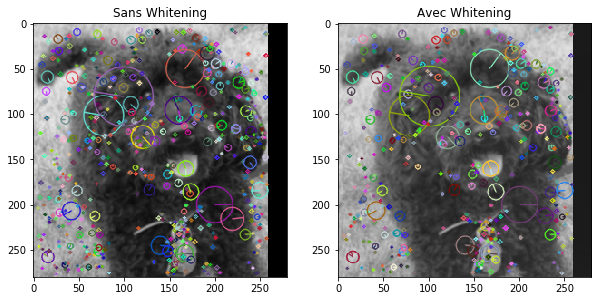

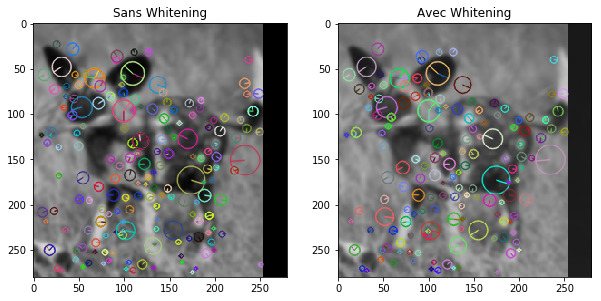

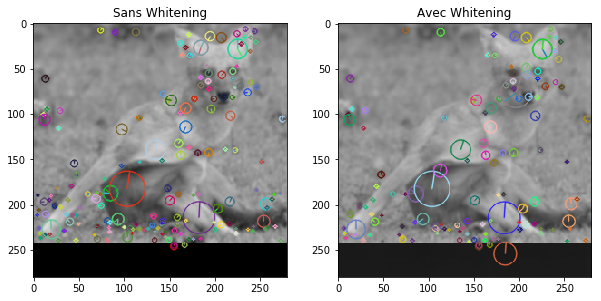

In [491]:
#affiche_diff_avec_sans_whitening('n02115641_7071', u_test, u_test_whitening)
affiche_diff_avec_sans_whitening('n02113712_3261', u_test, u_test_whitening)
#affiche_diff_avec_sans_whitening('n02113978_3822', u_test, u_test_whitening)
affiche_diff_avec_sans_whitening('n02116738_7008', u_test, u_test_whitening)
affiche_diff_avec_sans_whitening('n02115913_2480', u_test, u_test_whitening)
#affiche_diff_avec_sans_whitening('n02113712_3120', u_test, u_test_whitening)

## Extraction des Features

In [508]:
def normalize_SIFT(m_desc_sift):
    # On applique une normalisation Euclidienne
    tmp1 = m_desc_sift / np.sqrt(np.sum(np.square(m_desc_sift), axis=0))
    # On seuil les valeurs à 0.2
    tmp1 = np.where(tmp1>0.2, 0.2, tmp1)
    # On applique a nouveau une normalisation euclidienne
    tmp1 = tmp1 / np.sqrt(np.sum(np.square(tmp1), axis=0))
    
    return tmp1

def detect_SIFT(image_matrix, image_nb, IMAGE_SIZE = ( 280, 280,)):
    u1 = np.uint8(image_matrix[image_nb].reshape(IMAGE_SIZE))
    sift = cv2.xfeatures2d.SIFT_create()
    _, des1 = sift.detectAndCompute(u1, None)
    
    return normalize_SIFT(des1)

In [545]:
m_x1 = np.uint8(u_train_whit)
l_desc_sift = []

    
debut = datetime.now()
for image_nb in range(0,m_x1.shape[0]):
    tmp1 = pd.DataFrame(detect_SIFT(m_x1, image_nb, IMAGE_SIZE=( 280, 280,)))
    tmp1['Image_nb'] = image_nb
    l_desc_sift.append(tmp1)

fin = datetime.now()
print('Tps Extraction SIFT DESCRIPTEURS: ', fin-debut)

df_descripteur_SIFT_train = pd.concat(l_desc_sift)
df_descripteur_SIFT_train.fillna(value=0, inplace=True)
df_descripteur_SIFT_train.reset_index(drop=True, inplace=True)


/Users/seb/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/seb/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """


Tps Extraction SIFT DESCRIPTEURS:  0:00:07.769163


## Clustering des Features
> Nous voulons faire des clusters de ces features afin de regrouper les features qui se 'ressemblent' 
> <br> 
> Le centroïd de ces clusters sera la features 'moyenne' 

In [589]:
from sklearn.cluster import MiniBatchKMeans

def genere_cluster_from_features(df_features_SIFT):
    kmeans = MiniBatchKMeans(n_clusters=20)
    kmeans.fit_transform(df_descripteur_SIFT_train[df_descripteur_SIFT_train.columns[:-1]])

    return kmeans


In [548]:

debut = datetime.now()
# Il faut optimiser selon les silhouettes
m_kmeans = genere_cluster_from_features(df_descripteur_SIFT_train[df_descripteur_SIFT_train.columns[:-1]])

fin = datetime.now()
print('Tps Extraction SIFT DESCRIPTEURS: ', fin-debut)

Tps Extraction SIFT DESCRIPTEURS:  0:00:00.372597


### GridSearch pour identifier le bon nombre de clusters

In [627]:
def identify_best_MiniBatchKmeans_ClusterNumber(X, cluster_range=range(10, 81, 10)):
    from sklearn.cluster import MiniBatchKMeans
    from sklearn.model_selection import GridSearchCV
    #from sklearn.metrics import silhouette_score

    m_param_grid={'n_clusters': list(cluster_range)}
    gs = GridSearchCV(MiniBatchKMeans(), 
                      param_grid=m_param_grid, cv=7, refit=True,
                      return_train_score=True, )
    gs.fit(X)
    print('Le meilleur nombre de cluster est : ', gs.best_params_['n_clusters'])
    return gs

In [626]:
debut = datetime.now()
gs = identify_best_MiniBatchKmeans_ClusterNumber(
    df_descripteur_SIFT_train[df_descripteur_SIFT_train.columns[:-1]], 
    cluster_range=range(10, 81, 10),
)
fin = datetime.now()
print('Tps Test CLUSTERING: ', fin-debut)

Le meilleur nombre de cluster est :  80
Tps Test CLUSTERING:  0:00:27.094169


In [648]:
debut = datetime.now()
gs = identify_best_MiniBatchKmeans_ClusterNumber(
    df_descripteur_SIFT_train[df_descripteur_SIFT_train.columns[:-1]], 
    cluster_range=range(60, 91, 4),
)
fin = datetime.now()
print('Tps Test CLUSTERING: ', fin-debut)

Le meilleur nombre de cluster est :  72
Tps Test CLUSTERING:  0:01:04.333853


In [650]:
#T1 = df_descripteur_SIFT_train[df_descripteur_SIFT_train.columns[:-1]].loc[0]
#gs.predict([T1])

## Identification de l'histogramme

In [688]:
def genere_histogramme(X, Labels, range_cluster=range(72)):
    repartition_features = pd.DataFrame({'Images_nb': X.Image_nb, 'Cluster':Labels})
    tmp = repartition_features.groupby(by=['Images_nb', 'Cluster']).size().reset_index(name='Freq')
    tmp = tmp.pivot_table(index=['Images_nb'],columns=['Cluster'],values=['Freq'],fill_value=0)
    
    tmp.columns = tmp.columns.droplevel(level=0)
    
    if (tmp.shape[1]!=len(range_cluster)):
        # On ajoute les colonnes manquantes
        col_manquante = list(set(range_cluster)-set(tmp.columns)) 
        for co in col_manquante:
            tmp[co] = 0
        tmp = tmp[list(range_cluster)]
    
    tmp = pd.DataFrame(normalize_SIFT(tmp), index=tmp.index)
    return tmp

In [689]:
histo = genere_histogramme(
    df_descripteur_SIFT_train, 
    gs.best_estimator_.labels_
)

In [691]:
histo.head()

,0,1,2,3,4,5,6,7,8,9,...,62,63,64,65,66,67,68,69,70,71
Images_nb,,,,,,,,,,,,,,,,,,,,,
0,0.019885,0.0,0.006444,0.026445,0.107920,0.042181,0.124486,0.000000,0.041755,0.038560,...,0.0,0.010274,0.020096,0.024843,0.000000,0.012505,0.043295,0.004874,0.000000,0.049222
1,0.000000,0.0,0.045107,0.010578,0.071947,0.000000,0.112037,0.004019,0.041755,0.077120,...,0.0,0.041098,0.000000,0.024843,0.005869,0.037515,0.000000,0.029244,0.000000,0.000000
2,0.019885,0.0,0.006444,0.000000,0.071947,0.050617,0.062243,0.000000,0.055674,0.025707,...,0.0,0.020549,0.120578,0.016562,0.000000,0.025010,0.000000,0.000000,0.024304,0.000000
3,0.019885,0.0,0.000000,0.000000,0.017987,0.016872,0.024897,0.000000,0.083511,0.038560,...,0.0,0.020549,0.000000,0.008281,0.000000,0.025010,0.043295,0.000000,0.048607,0.024611
4,0.039770,0.0,0.006444,0.058178,0.000000,0.050617,0.062243,0.000000,0.013918,0.025707,...,0.0,0.041098,0.020096,0.066247,0.017608,0.050020,0.000000,0.009748,0.000000,0.024611


# Modélisation

> Notre variable histo est l'histogramme des descripteurs SIFT normalisés et seuillés.
> <br>
> C'est donc notre feature d'entrée pour modéliser notre problème
<br>
> Nous allons réaliser une réduction dimensionnelle afin de visualiser nos images pour modéliser notre problématique.


### Réduction Dimensionnelle

In [795]:
std = StandardScaler()
x0 = std.fit_transform(histo)

pca = PCA(n_components=72)
X = pca.fit_transform(x0)

le = LabelEncoder()
Y = le.fit_transform(desc_train.race)

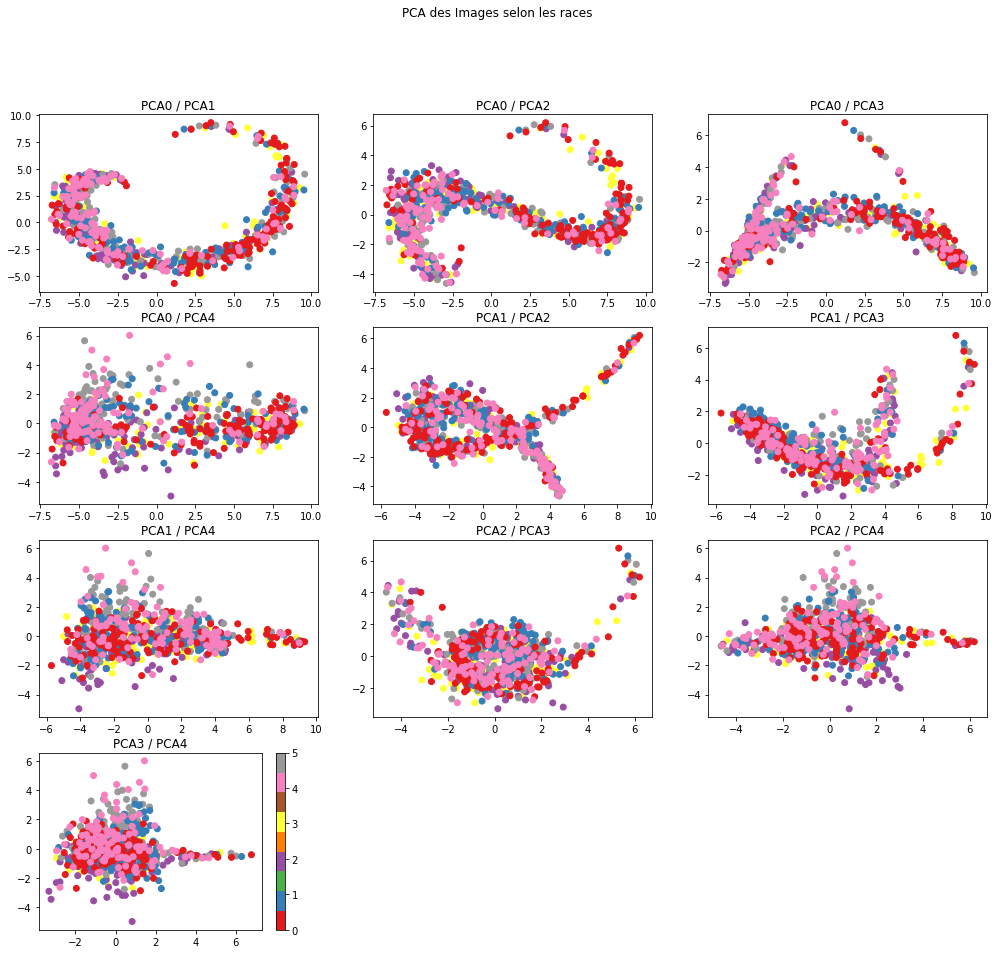

In [796]:
X = pd.DataFrame(X)

plt.figure(figsize=(17, 15))
idx = 0

for i in range(0,5):
    for j in range(i+1, 5):
        idx+=1
        plt.subplot(4, 3, idx)
        plt.scatter(x=X[i], y=X[j], c=Y, cmap='Set1')
        plt.title('PCA{} / PCA{}'.format(i, j))
plt.colorbar()
#plt.colorbar.set_label('Races des chiens')
plt.suptitle('PCA des Images selon les races')
plt.show()

### TEST DE SVC
> On applique le PCA et on ajoute les puissance de 2 

In [921]:
u = np.array([X[0], X[0]**2,  X[0]**3, X[1], X[1]**2,  X[1]**3, X[2], X[2]**2,  X[2]**3,])

In [922]:
Y.shape, u.shape

((754,), (9, 754))

In [924]:
from sklearn.svm import SVC

clf = SVC()
clf.fit(pd.DataFrame(u).T, Y)
clf.score(pd.DataFrame(u).T, Y)

0.9482758620689655

In [925]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=7000, max_depth=20, random_state=0)

clf.fit(pd.DataFrame(u).T, Y)
clf.score(pd.DataFrame(u).T, Y)

1.0

In [911]:
m_X.shape, m_y.shape

((4, 2), (4,))

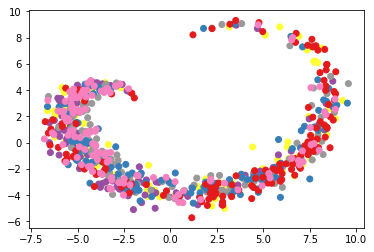

In [896]:
plt.scatter(x=(X[0]**1), y=X[1]**1, c=Y, cmap='Set1')
#plt.scatter(x=(X[1]**1), y=X[2]**1, c=Y, cmap='Set1')

plt.show()

In [831]:
tsne = TSNE(n_components=2, )

debut = datetime.now()
X_tsne = tsne.fit_transform(x0)
fin = datetime.now()
print('Tps TSNE: ', fin-debut)

Tps TSNE:  0:00:12.614996


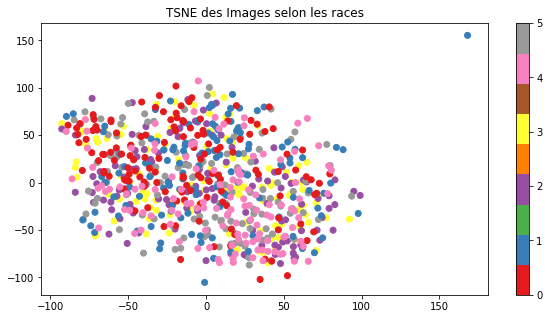

In [783]:
X_tsne = pd.DataFrame(X_tsne)

plt.figure(figsize=(10, 5))
plt.scatter(x=X_tsne[1], y=X_tsne[2], c=Y, cmap='Set1')
plt.colorbar()
plt.title('TSNE des Images selon les races')
plt.show()

### ISOMAP

Tps TSNE:  0:00:00.140894


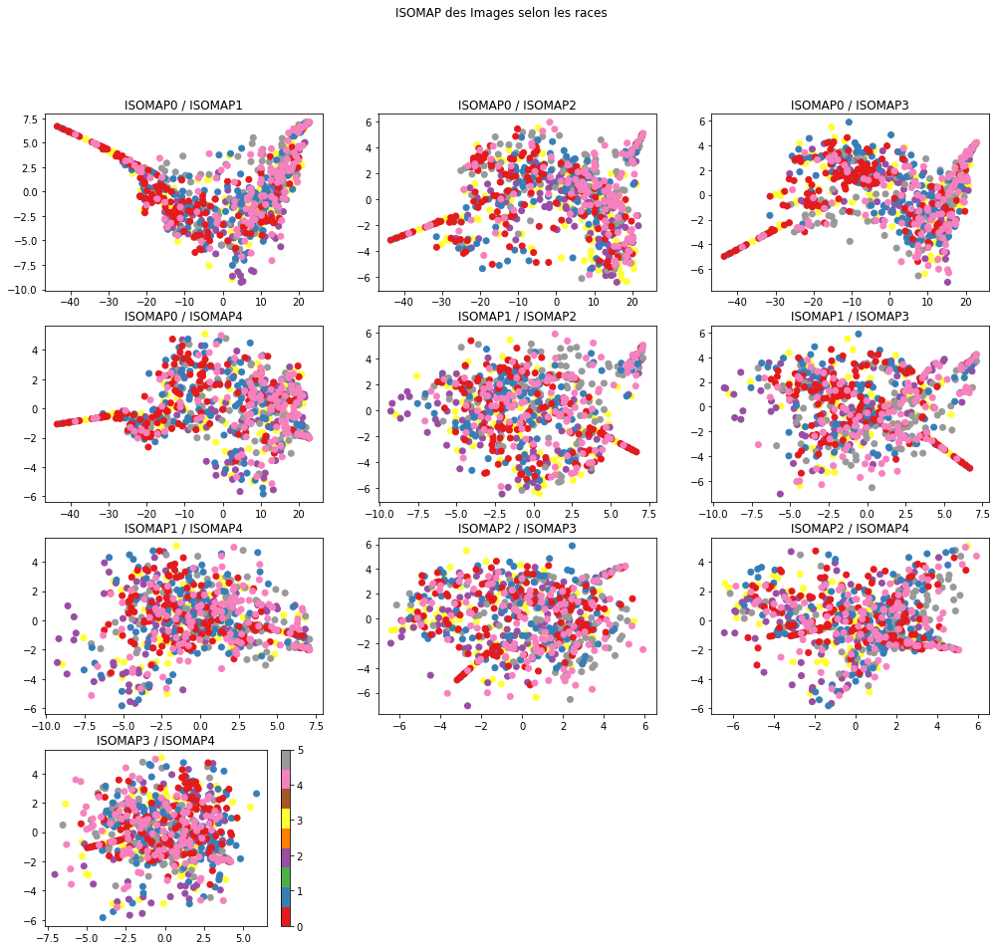

In [779]:
from sklearn.manifold import Isomap

debut = datetime.now()
embedding = Isomap(n_components=5)
###X_transformed = embedding.fit_transform(x0)

###### ATTENTION X est un PCA
X_transformed = embedding.fit_transform(X)
fin = datetime.now()
print('Tps TSNE: ', fin-debut)

### ON AFFICHE

X_transformed = pd.DataFrame(X_transformed)

plt.figure(figsize=(17, 15))
idx = 0

for i in range(0,5):
    for j in range(i+1, 5):
        idx+=1
        plt.subplot(4, 3, idx)
        plt.scatter(x=X_transformed[i], y=X_transformed[j], c=Y, cmap='Set1')
        plt.title('ISOMAP{} / ISOMAP{}'.format(i, j))
plt.colorbar()
#plt.colorbar.set_label('Races des chiens')
plt.suptitle('ISOMAP des Images selon les races')
plt.show()

#### LLE 

Tps LLE:  0:00:00.135669


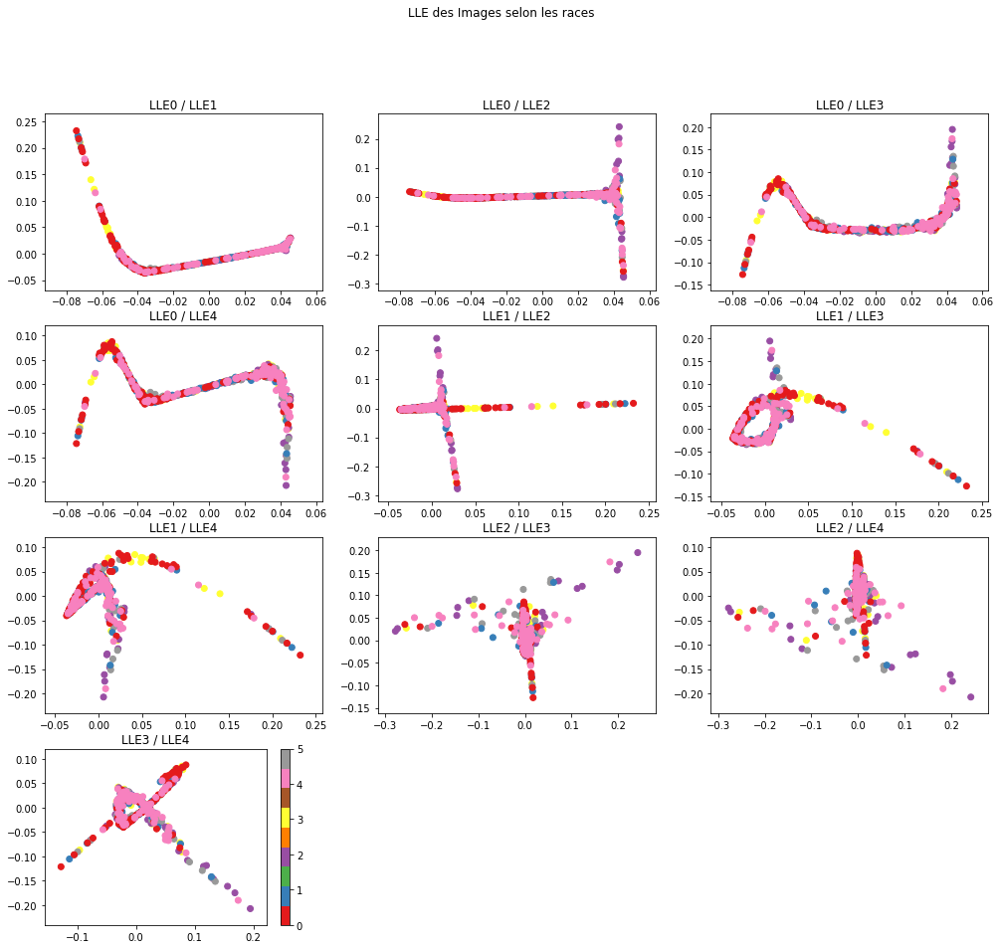

In [789]:
from sklearn.manifold import LocallyLinearEmbedding

debut = datetime.now()
embedding = LocallyLinearEmbedding(n_components=10, n_neighbors=10)
X_transformed = embedding.fit_transform(x0)

fin = datetime.now()
print('Tps LLE: ', fin-debut)



### ON AFFICHE
X_transformed = pd.DataFrame(X_transformed)

plt.figure(figsize=(17, 15))
idx = 0

for i in range(0,5):
    for j in range(i+1, 5):
        idx+=1
        plt.subplot(4, 3, idx)
        plt.scatter(x=X_transformed[i], y=X_transformed[j], c=Y, cmap='Set1')
        plt.title('LLE{} / LLE{}'.format(i, j))
plt.colorbar()
#plt.colorbar.set_label('Races des chiens')
plt.suptitle('LLE des Images selon les races')
plt.show()


In [767]:
np.sum((X_transformed[0]>-0.04) & (X_transformed[1]<0.01))

17

### MDS 

In [787]:
from sklearn.manifold import MDS

debut = datetime.now()
embedding = MDS(n_components=10, )
X_transformed = embedding.fit_transform(x0)

fin = datetime.now()
print('Tps MDS: ', fin-debut)

### ON AFFICHE
X_transformed = pd.DataFrame(X_transformed)


Tps MDS:  0:00:08.140133


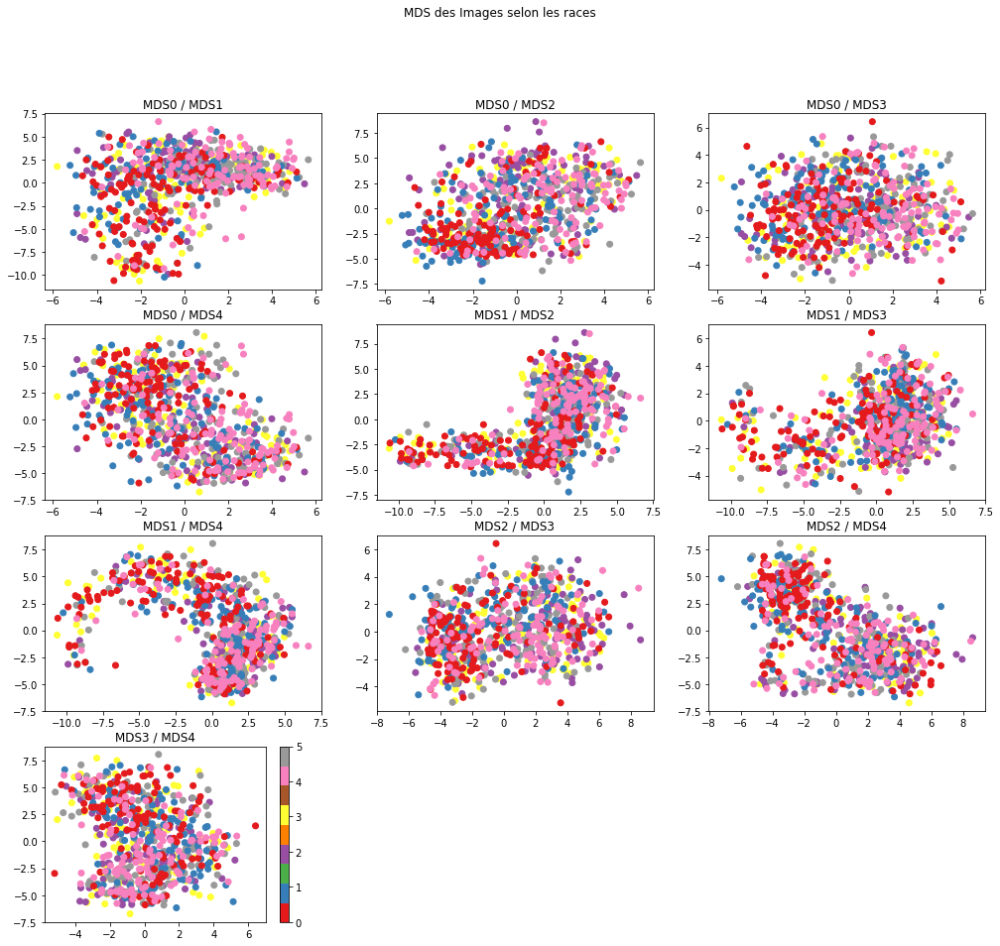

In [788]:
plt.figure(figsize=(17, 15))
idx = 0

for i in range(0,5):
    for j in range(i+1, 5):
        idx+=1
        plt.subplot(4, 3, idx)
        plt.scatter(x=X_transformed[i], y=X_transformed[j], c=Y, cmap='Set1')
        plt.title('MDS{} / MDS{}'.format(i, j))
plt.colorbar()
#plt.colorbar.set_label('Races des chiens')
plt.suptitle('MDS des Images selon les races')
plt.show()

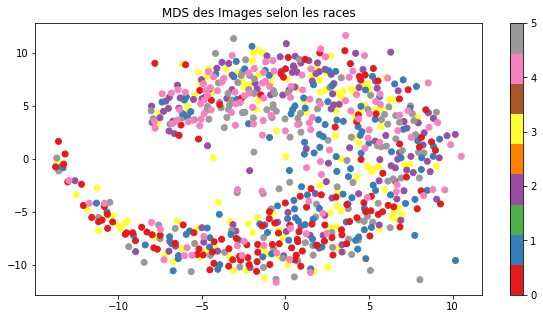

In [770]:
plt.figure(figsize=(10, 5))
plt.scatter(x=X_transformed[0], y=X_transformed[1], c=Y, cmap='Set1')
#plt.plot([-0.06, 0.00], [-0.02, 0.02], )
plt.colorbar()
plt.title('MDS des Images selon les races')
plt.show()

# Synthèse des manipulations 
> Nous allons faire une fonction qui va résumer les opérations 
> <br>
> Nous les relancerons sur des DataSet plus importants ensuite

In [ ]:
def normalize_SIFT(m_desc_sift):
    # On applique une normalisation Euclidienne
    tmp1 = m_desc_sift / np.sqrt(np.sum(np.square(m_desc_sift), axis=0))
    # On seuil les valeurs à 0.2
    tmp1 = np.where(tmp1>0.2, 0.2, tmp1)
    # On applique a nouveau une normalisation euclidienne
    tmp1 = tmp1 / np.sqrt(np.sum(np.square(tmp1), axis=0))
    
    return tmp1

def detect_SIFT(image_matrix, image_nb, IMAGE_SIZE = ( 280, 280,)):
    u1 = np.uint8(image_matrix[image_nb].reshape(IMAGE_SIZE))
    sift = cv2.xfeatures2d.SIFT_create()
    _, des1 = sift.detectAndCompute(u1, None)
    
    return normalize_SIFT(des1)

In [1273]:
def genere_histogramme(X, Labels, range_cluster=range(72)):
    repartition_features = pd.DataFrame({'Images_nb': X.Image_nb, 'Cluster':Labels})
    tmp = repartition_features.groupby(by=['Images_nb', 'Cluster']).size().reset_index(name='Freq')
    tmp = tmp.pivot_table(index=['Images_nb'],columns=['Cluster'],values=['Freq'],fill_value=0)
    
    tmp.columns = tmp.columns.droplevel(level=0)
    
    if (tmp.shape[1]!=len(range_cluster)):
        # On ajoute les colonnes manquantes
        col_manquante = list(set(range_cluster)-set(tmp.columns)) 
        for co in col_manquante:
            tmp[co] = 0.01
        tmp = tmp[list(range_cluster)]
    
    tmp = pd.DataFrame(normalize_SIFT(tmp), index=tmp.index)
    return tmp

In [1283]:
def detect_SIFT(image_matrix, image_nb, IMAGE_SIZE = ( 280, 280,)):
    u1 = np.uint8(image_matrix[image_nb].reshape(IMAGE_SIZE))
    sift = cv2.xfeatures2d.SIFT_create()
    _, des1 = sift.detectAndCompute(u1, None)
    return normalize_SIFT(des1)

def detect_SURF(image_matrix, image_nb, IMAGE_SIZE = ( 280, 280,)):
    u1 = np.uint8(image_matrix[image_nb].reshape(IMAGE_SIZE))
    surf = cv2.xfeatures2d.SURF_create()
    _, des1 = surf.detectAndCompute(u1, None)
    return normalize_SIFT(des1)

def detect_ORB(image_matrix, image_nb, IMAGE_SIZE = ( 280, 280,)):
    u1 = np.uint8(image_matrix[image_nb].reshape(IMAGE_SIZE))
    orb = cv2.ORB_create()
    kp = orb.detect(u1,None)
    _, des1 = orb.compute(u1, kp)
    if des1 is None:
        return 0.01*np.ones(32).reshape(1,-1)
    else:
        return normalize_SIFT(des1)

def detect_BRIEF(image_matrix, image_nb, IMAGE_SIZE = ( 280, 280,)):
    u1 = np.uint8(image_matrix[image_nb].reshape(IMAGE_SIZE))
    star = cv2.xfeatures2d.StarDetector_create()
    brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
    
    kp = star.detect(u1,None)
    _, des1 = brief.compute(u1, kp)
    if des1 is None:
        return 0.01*np.ones(32).reshape(1,-1)
    else:
        return normalize_SIFT(des1)
    

In [958]:
def whitening(X, epsilon=0.1):
    X_norm = X / 255.
    cov = np.cov(X_norm, rowvar=True)
    U,S,V = np.linalg.svd(cov)
  
    MAT1 = U.dot(np.diag(1.0/np.sqrt(S + epsilon))).dot(U.T)
    #X_ZCA = U.dot(np.diag(1.0/np.sqrt(S + epsilon))).dot(U.T).dot(X_norm)
    X_ZCA = MAT1.dot(X_norm)
    X_ZCA_rescaled = (X_ZCA - X_ZCA.min()) / (X_ZCA.max() - X_ZCA.min())
    
    X_ZCA_rescaled = np.uint8(X_ZCA_rescaled*255)
    return X_ZCA_rescaled



In [1333]:
def create_image_matrix(desc, BLUR_SIGMAX=1.0):
    l_np_image = []
    SIZE = (280, 280)
    for image_name in desc.index.tolist():
        m_image = stt.transforme_image(
            desc=desc, 
            name=image_name, 
            rep_path=path1,
            is_crop=True, 
            is_resize=True, 
            is_blur=True,
            is_Inline=True, 
            BLUR_SIZE=5, 
            BLUR_SIGMAX=BLUR_SIGMAX,
            is_equalizeHist=True, 
            is_resize_into=False,
            SIZE_GLOBAL=SIZE
        )
        l_np_image.append(m_image)
    return l_np_image

In [1083]:
def generation_df_SIFT(x_train, SIZE):
    l_desc_sift = []
    for image_nb in range(0,x_train.shape[0]):
        tmp1 = pd.DataFrame(detect_SIFT(x_train, image_nb, IMAGE_SIZE=SIZE))
        tmp1['Image_nb'] = image_nb
        l_desc_sift.append(tmp1)

    df_descripteur_SIFT = pd.concat(l_desc_sift)
    df_descripteur_SIFT.fillna(value=0, inplace=True)
    df_descripteur_SIFT.reset_index(drop=True, inplace=True)
    return df_descripteur_SIFT


def generation_df_XXXX(x_train, SIZE, METHOD='SIFT'):
    l_desc_XXX = []
    for image_nb in range(0,x_train.shape[0]):
        if METHOD=='SIFT':
            tmp1 = pd.DataFrame(detect_SIFT(x_train, image_nb, IMAGE_SIZE=SIZE))
        elif METHOD=='SURF':
            tmp1 = pd.DataFrame(detect_SURF(x_train, image_nb, IMAGE_SIZE=SIZE))
        elif METHOD=='ORB':
            tmp1 = pd.DataFrame(detect_ORB(x_train, image_nb, IMAGE_SIZE=SIZE))
        else:
            tmp1 = pd.DataFrame(detect_BRIEF(x_train, image_nb, IMAGE_SIZE=SIZE))
        tmp1['Image_nb'] = image_nb
        l_desc_XXX.append(tmp1)

    df_descripteur_XXX = pd.concat(l_desc_XXX)
    df_descripteur_XXX.fillna(value=0, inplace=True)
    df_descripteur_XXX.reset_index(drop=True, inplace=True)
    return df_descripteur_XXX

In [1361]:
def identify_best_Kmeans_ClNb(X, cluster_range=range(10, 81, 10)):
    from sklearn.cluster import MiniBatchKMeans
    from sklearn.model_selection import GridSearchCV

    m_param_grid={'n_clusters': list(cluster_range)}
    gs = GridSearchCV(MiniBatchKMeans(), 
                      param_grid=m_param_grid, cv=3, refit=True,
                      return_train_score=True, )
    gs.fit(X[X.columns[:-1]])
    print('Le meilleur nombre de cluster est : ', gs.best_params_['n_clusters'])
    return gs

In [1264]:
def fabrication_Histogramme_from_Feature(
    z_train, z_test, 
    SIZE=( 280, 280,), METHOD='SIFT', 
    cluster_range=range(60, 91, 4)):
    '''Fonction qui renvoie l'histogramme Train/Test pour la méthode de Feature donnée'''
    
    # 1 - Extraction des Features
    df_descripteur_XXX_train = generation_df_XXXX(z_train, SIZE=SIZE, METHOD=METHOD)
    df_descripteur_XXX_test = generation_df_XXXX(z_test, SIZE=SIZE, METHOD=METHOD)
    
    # 2 - Identification des K-Means
    gs_train_XXX = identify_best_Kmeans_ClNb(
        df_descripteur_XXX_train, cluster_range=cluster_range)
    Label_test_XXX = gs_train_XXX.predict(
        df_descripteur_XXX_test[df_descripteur_XXX_test.columns[:-1]])  
    
    # 3 - Génération des Histogramme
    histo_train_XXX = genere_histogramme(df_descripteur_XXX_train, gs_train_XXX.best_estimator_.labels_)
    histo_test_XXX = genere_histogramme(df_descripteur_XXX_test, Label_test_XXX)
    
    
    print('METHODE {} - Nb de valeurs Nulles {} -- {}'.format(
        METHOD,
        np.sum(np.sum(X_train.isnull(), axis=0)),
        np.sum(np.sum(X_test.isnull(), axis=0)) ))
    print('\t-> X_train.shape = {} -- X_test.shape = {}'.format(X_train.shape, X_test.shape))
    return histo_train_XXX, histo_test_XXX
  

In [1359]:
def Programme_general_V4(desc_train, desc_test):
    # Etape 1 : On met toutes les images dans une même matrice

    ####### CREATION DES MATRICES D'IMAGES

    ## Pour le Train
    debut = datetime.now()
    u_train = create_image_matrix(desc_train, BLUR_SIGMAX=0.5)
    u_train = np.array(u_train)

    ## Pour le Test
    # On Applique du Whitening sur le DataSet
    u_test = create_image_matrix(desc_test, BLUR_SIGMAX=0.5)
    u_test = np.array(u_test)
    fin = datetime.now()
    print('Tps Création Matrices Images: ', fin-debut)

    debut = datetime.now()
    u_train_whit = whitening(u_train, epsilon=1.5)
    u_test_whit = whitening(u_test, epsilon=1.5)
    ####u_train_whit = u_train
    ####u_test_whit = u_test
    fin = datetime.now()
    print('Tps Whitening: ', fin-debut)

    ####### GENERATION DES HISTOGRAMMES
    ### SIFT 
    debut = datetime.now()
    
    ######return u_train_whit, u_test_whit
    
    
    histo_train_SIFT, histo_test_SIFT = fabrication_Histogramme_from_Feature(
        u_train_whit, u_test_whit, SIZE=( 280, 280,), METHOD='SIFT', 
        cluster_range=range(60, 91, 4))
    fin = datetime.now()
    print('\t->Histo SIFT : ', fin-debut)

    debut = datetime.now()
    histo_train_SURF, histo_test_SURF = fabrication_Histogramme_from_Feature(
        u_train_whit, u_test_whit, SIZE=( 280, 280,), METHOD='SURF', 
        cluster_range=range(60, 91, 4))
    fin = datetime.now()
    print('\t->Histo SURF : ', fin-debut)

    #### ON ARRIVE A 60 DONC ON RECOMMENCE A TESTER A 40
    debut = datetime.now()
    histo_train_ORB, histo_test_ORB = fabrication_Histogramme_from_Feature(
        u_train_whit, u_test_whit, SIZE=( 280, 280,), METHOD='ORB', 
        cluster_range=range(40, 91, 10))
    fin = datetime.now()
    print('\t->Histo ORB : ', fin-debut)

    debut = datetime.now()
    histo_train_BRIEF, histo_test_BRIEF = fabrication_Histogramme_from_Feature(
        u_train_whit, u_test_whit, SIZE=( 280, 280,), METHOD='BRIEF', 
        cluster_range=range(80, 101, 10))
    fin = datetime.now()
    print('\t->Histo BRIEF : ', fin-debut)


    ######## FABRICATION des Histogrammes GLOBAUX
    histo_train = pd.concat([histo_train_SIFT, 
                             histo_train_SURF, 
                             histo_train_ORB,
                             histo_train_BRIEF], axis=1)
    
    histo_test = pd.concat([histo_test_SIFT, 
                             histo_test_SURF, 
                             histo_test_ORB,
                             histo_test_BRIEF], axis=1)
    
    return histo_train, histo_test

### Lancement Des Données

In [1360]:
debut0 = datetime.now()

X_train, X_test = Programme_general_V4(
    desc_train=desc_train, desc_test=desc_test)

fin0 = datetime.now()
print('Tps GLOBAL: ', fin0-debut0)

Tps Création Matrices Images:  0:00:02.172729
Tps Whitening:  0:00:02.887964
Le meilleur nombre de cluster est :  84
METHODE SIFT - Nb de valeurs Nulles 0 -- 0
	-> X_train.shape = (754, 288) -- X_test.shape = (190, 288)
	->Histo SIFT :  0:03:17.379387
Le meilleur nombre de cluster est :  88
METHODE SURF - Nb de valeurs Nulles 0 -- 0
	-> X_train.shape = (754, 288) -- X_test.shape = (190, 288)
	->Histo SURF :  0:03:02.479978
Le meilleur nombre de cluster est :  90
METHODE ORB - Nb de valeurs Nulles 0 -- 0
	-> X_train.shape = (754, 288) -- X_test.shape = (190, 288)
	->Histo ORB :  0:01:17.588814


/Users/seb/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/seb/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/seb/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """


Le meilleur nombre de cluster est :  80
METHODE BRIEF - Nb de valeurs Nulles 0 -- 0
	-> X_train.shape = (754, 288) -- X_test.shape = (190, 288)
	->Histo BRIEF :  0:00:04.069834
Tps GLOBAL:  0:07:46.591758


### ON analyse pour SIFT

In [1254]:
X_train.fillna(value=0, inplace=True)
X_test.fillna(value=0, inplace=True)

In [1362]:
from sklearn.feature_extraction.text import TfidfTransformer
tfidf = TfidfTransformer(use_idf=True)
X_train_tf = tfidf.fit_transform(X_train).todense()
X_test_tf = tfidf.transform(X_test).todense()

X_train.to_csv('output/I_X_train.csv', index=False)
X_test.to_csv('output/I_X_test.csv', index=False)

### Réduction Dimensionnelle : PCA

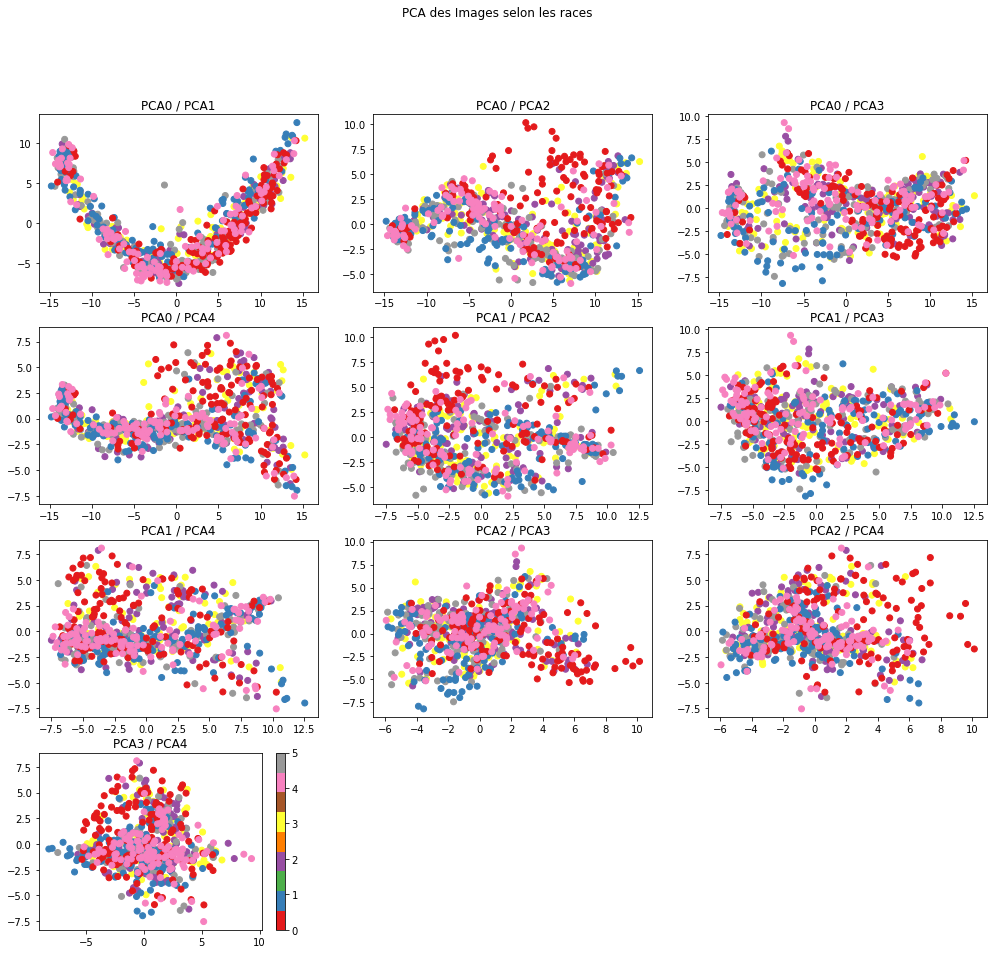

In [1363]:
std = StandardScaler()
x0 = std.fit_transform(X_train)
x0_test = std.transform(X_test)

pca = PCA(n_components=72)
X = pca.fit_transform(x0)
X_t = pca.transform(x0_test)

le = LabelEncoder()
Y = le.fit_transform(desc_train.race)
Y_t = le.fit_transform(desc_test.race)

X = pd.DataFrame(X)
X_t = pd.DataFrame(X_t)

plt.figure(figsize=(17, 15))
idx = 0

for i in range(0,5):
    for j in range(i+1, 5):
        idx+=1
        plt.subplot(4, 3, idx)
        plt.scatter(x=X[i], y=X[j], c=Y, cmap='Set1')
        plt.title('PCA{} / PCA{}'.format(i, j))
plt.colorbar()
#plt.colorbar.set_label('Races des chiens')
plt.suptitle('PCA des Images selon les races')
plt.show()

In [1114]:
X.shape, Y.shape

((754, 72), (754,))

In [1364]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
 
### On Fabrique u 
u = np.array([X[0], X[0]**2,  X[0]**3, X[1], X[1]**2, X[1]**3,
              X[2], X[2]**2,  X[2]**3,])
u_t = np.array([X_t[0], X_t[0]**2, X_t[0]**3, X_t[1], X_t[1]**2, X_t[1]**3,
                X_t[2], X_t[2]**2,  X_t[2]**3,])

### Classifier 
#clf = SVC()
###clf = RandomForestClassifier(n_estimators=7000, max_depth=20, random_state=0)
clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')

clf.fit(pd.DataFrame(u).T, Y)
print('Score Train : ', clf.score(pd.DataFrame(u).T, Y))
print('Score Test : ', clf.score(pd.DataFrame(u_t).T, Y_t))

#clf.fit(X_train, Y)
#print('Score Train : ', clf.score(X_train, Y))
#print('Score Test : ', clf.score(X_test, Y_t))


# 0.2684 

Score Train :  0.29310344827586204
Score Test :  0.20526315789473684


In [1365]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
 
### Classifier 
###clf = SVC()
###clf = RandomForestClassifier(n_estimators=7000, max_depth=20, random_state=0)
clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')
clf.fit(X_train_tf, Y)
print('Score Train : ', clf.score(X_train_tf, Y))
print('Score Test : ', clf.score(X_test_tf, Y_t))

###0.3578

Score Train :  0.5265251989389921
Score Test :  0.25263157894736843


In [1366]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

### Classifier 
###clf = SVC()
#clf = RandomForestClassifier(n_estimators=7000, max_depth=20, random_state=0)
clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')

clf.fit(X_train, Y)
print('Score Train : ', clf.score(X_train, Y))
print('Score Test : ', clf.score(X_test, Y_t))

###Score Test :  0.3631
###0.3368

Score Train :  0.53315649867374
Score Test :  0.28421052631578947


> Il semble que la modélisation via une Classification de Logistic Régression apporte de bons résultats assez rapides.
> <br>
> Nous allons pouvoir prendre ce modèle pour tester les paramètres de traitement d'image les plus adaptés, le tout plus rapidement.

# Synthèses des résultats

- Groupe A : 
    - m_image = stt.transforme_image(
            desc=desc, 
            name=image_name, 
            rep_path=path1,
            is_crop=True, 
            is_resize=True, 
            is_blur=True,
            is_Inline=True, 
            BLUR_SIZE=5, 
            BLUR_SIGMAX=BLUR_SIGMAX,
            is_equalizeHist=False, 
            is_resize_into=True,
            SIZE_GLOBAL=SIZE
        )
    - BLUR = 1.0
    - Pas de Whitening
    
clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')
<br>
clf.fit(X_train_tf, Y)
 <br>   Score Train :  0.5610079575596817
 <br>   Score Test :  0.3526315789473684

- Groupe B
    - m_image = stt.transforme_image(
                desc=desc, 
                name=image_name, 
                rep_path=path1,
                is_crop=True, 
                is_resize=True, 
                is_blur=True,
                is_Inline=True, 
                BLUR_SIZE=5, 
                BLUR_SIGMAX=BLUR_SIGMAX,
                is_equalizeHist=False, 
                is_resize_into=True,
                SIZE_GLOBAL=SIZE
            )
    - BLUR = 0.5
    - Pas de Whitening

clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')
<br>
clf.fit(X_train_tf, Y)
<br>
Score Train :  0.5663129973474801
<br>
Score Test :  0.35789473684210527

<br>clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')
<br>clf.fit(X_train, Y)
<br>Score Train :  0.5875331564986738
<br>Score Test :  0.3631578947368421

- Groupe C
    - m_image = stt.transforme_image(
                desc=desc, 
                name=image_name, 
                rep_path=path1,
                is_crop=True, 
                is_resize=True, 
                is_blur=True,
                is_Inline=True, 
                BLUR_SIZE=5, 
                BLUR_SIGMAX=BLUR_SIGMAX,
                is_equalizeHist=False, 
                is_resize_into=True,
                SIZE_GLOBAL=SIZE
            )
    - BLUR = 0.5
    - Whitening

<br>clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')
<br>clf.fit(X_train, Y)
<br>Score Train :  0.5079575596816976
<br>Score Test :  0.3

- Groupe D
    - m_image = stt.transforme_image(
                desc=desc, 
                name=image_name, 
                rep_path=path1,
                is_crop=True, 
                is_resize=True, 
                is_blur=True,
                is_Inline=True, 
                BLUR_SIZE=5, 
                BLUR_SIGMAX=BLUR_SIGMAX,
                is_equalizeHist=False, 
                is_resize_into=True,
                SIZE_GLOBAL=SIZE
            )
    - BLUR = 1.0
    - Whitening

<br>clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')
<br>clf.fit(X_train_tf, Y)
<br>Score Train :  0.5397877984084881
<br>Score Test :  0.2894736842105263

- Groupe E
    - m_image = stt.transforme_image(
                desc=desc, 
                name=image_name, 
                rep_path=path1,
                is_crop=True, 
                is_resize=True,        
                is_blur=True,
                is_Inline=True, 
                BLUR_SIZE=5, 
                BLUR_SIGMAX=BLUR_SIGMAX,
                is_equalizeHist=False, 
                is_resize_into=XX,      FALSE
                SIZE_GLOBAL=SIZE
            )
    - BLUR = 0.5
    - Whitening

<br>clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')
<br>clf.fit(X_train, Y)
<br>Score Train :  0.5291777188328912
<br>Score Test :  0.30526315789473685

- Groupe F
    - m_image = stt.transforme_image(
                desc=desc, 
                name=image_name, 
                rep_path=path1,
                is_crop=True, 
                is_resize=True,        
                is_blur=True,
                is_Inline=True, 
                BLUR_SIZE=5, 
                BLUR_SIGMAX=BLUR_SIGMAX,
                is_equalizeHist=XX,     TRUE
                is_resize_into=XX,      FALSE
                SIZE_GLOBAL=SIZE
            )
    - BLUR = 0.5
    - Whitening

<br>clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')
<br>clf.fit(X_train, Y)
<br>Score Train :  0.4973474801061008
<br>Score Test :  0.28421052631578947

- Groupe G
    - m_image = stt.transforme_image(
                desc=desc, 
                name=image_name, 
                rep_path=path1,
                is_crop=True, 
                is_resize=True,        
                is_blur=True,
                is_Inline=True, 
                BLUR_SIZE=5, 
                BLUR_SIGMAX=BLUR_SIGMAX,
                is_equalizeHist=XX,     TRUE
                is_resize_into=XX,      FALSE
                SIZE_GLOBAL=SIZE
            )
    - BLUR = 1.0
    - SANS Whitening

<br>clf = LogisticRegression(solver='lbfgs', multi_class='multinomial', penalty='l2')
<br>clf.fit(X_train, Y)
<br>Score Train :  0.5159151193633952
<br>Score Test :  0.2578947368421053


- Groupe H 
    - m_image = stt.transforme_image(
                desc=desc, 
                name=image_name, 
                rep_path=path1,
                is_crop=True, 
                is_resize=True,        
                is_blur=True,
                is_Inline=True, 
                BLUR_SIZE=5, 
                BLUR_SIGMAX=BLUR_SIGMAX,
                is_equalizeHist=XX,     TRUE
                is_resize_into=XX,      FALSE
                SIZE_GLOBAL=SIZE
            )
    - BLUR = 0.5
    - SANS Whitening
<br>Score Train :  0.5225464190981433
<br>Score Test :  0.3368421052631579


- Groupe I 
    - m_image = stt.transforme_image(
                desc=desc, 
                name=image_name, 
                rep_path=path1,
                is_crop=True, 
                is_resize=True,        
                is_blur=True,
                is_Inline=True, 
                BLUR_SIZE=5, 
                BLUR_SIGMAX=BLUR_SIGMAX,
                is_equalizeHist=XX,     TRUE
                is_resize_into=XX,      FALSE
                SIZE_GLOBAL=SIZE
            )
    - BLUR = 0.5
    - AVEC Whitening
<br>Score Train :  0.53315649867374
<br>Score Test :  0.28421052631578947






> Le groupe B apporte le meilleur résultat
```python
    is_crop=True, 
    is_resize=True, 
    is_blur=True,
    is_Inline=True, 
    BLUR_SIZE=5, 
    BLUR_SIGMAX=BLUR_SIGMAX,
    is_equalizeHist=False, 
    is_resize_into=True,
    SIZE_GLOBAL=SIZE
    )
BLUR = 0.5
Pas de Whitening
```

> Nous appliquons donc ces transformations pour toutes les données que nous avons à notre disposition:
    - crop par rapport aux cadres donnés
    - resize en (280, 280) avec conservation des proportions
    - Blur avec un ecart type de 0.5
    - pas d'application d'égalisation d'histogramme